## LOAD PACKAGE

In [1]:
#| export

# import kagglehub
# !pip install peft

import os
import io
import re
import random
import base64
from io import BytesIO

import time
from datetime import timedelta

import numpy as np

import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F

from IPython.display import SVG

from PIL import Image


import cv2


from diffusers import StableDiffusionPipeline
from transformers import AutoProcessor, AutoModel
import metric


c:\Users\YongsanHuang\.conda\envs\sd\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Loading checkpoint shards: 100%|██████████| 2/2 [00:04<00:00,  2.21s/it]


decoded text =  100
decoded text =  100
Does <image> portray "SVG illustration of a red circle" without any lettering? Answer yes or no.
decoded text =  100
decoded text =  100


## Competition Metric Helpers

We also want to evaluate metrics of the original bitmap before converting to svg. Let’s implement it using [metric package](https://www.kaggle.com/code/jiazhuang/svg-image-fidelity).

In [2]:
import numpy as np
import statistics
import pandas as pd

def image_resize(image, size=(384, 384)):
    return image.convert('RGB').resize(size)

def bitmap_score_instance_impl(multiple_choice_qa, image, random_seed=42):
    rng = np.random.RandomState(random_seed)
    group_seed = rng.randint(0, np.iinfo(np.int32).max)
    image_processor = metric.ImageProcessor(image=image_resize(image), seed=group_seed).apply()
    image = image_processor.image.copy()
    questions = multiple_choice_qa['question']
    choices = multiple_choice_qa['choices']
    answers = multiple_choice_qa['answer']
    aesthetic_score = metric.aesthetic_evaluator.score(image)
    vqa_score = metric.vqa_evaluator.score(questions, choices, answers, image)
    image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
    ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    instance_score = metric.harmonic_mean(vqa_score, aesthetic_score, beta=0.5) * ocr_score
    return instance_score, vqa_score, ocr_score, aesthetic_score

def bitmap_score_instance(multiple_choice_qa, image, random_seed=42):
    is_single = not isinstance(image, list)
    if is_single:
        multiple_choice_qa = [multiple_choice_qa]
        image = [image]
    
    assert len(multiple_choice_qa) == len(image)

    results = []
    score_df = []
    for one_image, one_multiple_choice_qa in zip(image, multiple_choice_qa, strict=True):
        instance_score, vqa_score, ocr_score, aesthetic_score = bitmap_score_instance_impl(one_multiple_choice_qa, one_image, random_seed=42)
        results.append(instance_score)
        score_df.append([instance_score, vqa_score, ocr_score, aesthetic_score])

    fidelity = statistics.mean(results)
    score_df = pd.DataFrame(score_df, columns=['competition_score', 'vqa_score', 'ocr_score', 'aesthetic_score'])
    if is_single:
        return score_df.iloc[0].to_dict()
    else:
        return float(fidelity), score_df

## Load SDXL

In [3]:
%%time
#| export

# Ensure GPU is being used and optimize for speed
# device = "cuda:0" if torch.cuda.is_available() else "cpu"
# print(f"Using device: {device}")


import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler, StableDiffusionXLPipeline
from diffusers import AutoPipelineForText2Image
from diffusers.utils import load_image
from diffusers import StableDiffusionXLPipeline, LCMScheduler
from diffusers.utils import load_image
from diffusers.utils.import_utils import is_xformers_available
from diffusers import StableDiffusionXLPipeline, DPMSolverMultistepScheduler


# sdxl =============================================================
sd_path = "stable-diffusion-xl-base-1.0"

pipe = StableDiffusionXLPipeline.from_pretrained(
    sd_path,
    torch_dtype=torch.float16,
    variant = "fp16",
    use_safetensors=True
)


# ddim:
# scheduler = DDIMScheduler.from_pretrained(sd_path, subfolder="scheduler")

# Load DPM++2M SDE scheduler
scheduler = DPMSolverMultistepScheduler.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    subfolder="scheduler"
)
# REQUIRED: Fixes for <50 steps & SDXL stability
scheduler.algorithm_type = "sde-dpmsolver++"
scheduler.solver_order = 2
scheduler.use_karras_sigmas = True
scheduler.euler_at_final = True  # <- this avoids last-step artifact
scheduler.timestep_spacing = "trailing"  # SDXL requires this
# Assign to pipeline
pipe.scheduler = scheduler

pipe.to("cuda:0")



# add lora ====================================================

# # Load LoRA weights (local path or Hugging Face repo ID)
# pipe.load_lora_weights("lora", weight_name="Luminescent_impasto_sdxl.safetensors")

# # To activate LoRA: specify `scale` (0.0 to 1.0, default 1.0)
# pipe.fuse_lora(lora_scale=0.8)

# When using torch >= 2.0, you can improve the inference speed by 20-30% with torch.compile
# but this is linux only becuase it requires triton
# pipe.unet = torch.compile(pipe.unet, mode="reduce-overhead", fullgraph=True)

# generate bitmap ====================================================
# for sdxl(not turbo version), use 1024 for best quality, 512-768 is ok but not as good

def generate_bitmap(prompt, negative_prompt="", size = 768, num_inference_steps=25, guidance_scale=20):
        
    image = pipe(
        prompt=prompt, #to OPAI CLIP-ViT/L-14, for comma separated prompts
        # prompt_2=prompt, #to OpenCLIP-ViT/bigG-14, for sentence
        negative_prompt=negative_prompt,
        num_inference_steps=num_inference_steps, 
        guidance_scale=guidance_scale,
        height=size,
        width=size,
    ).images[0]
    
    return image

pipe

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 12.84it/s]


CPU times: total: 1.42 s
Wall time: 5.33 s


StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.33.1",
  "_name_or_path": "stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DPMSolverMultistepScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

## LOAD SDXL TURBO

In [4]:
# %%time
# #| export

# # Ensure GPU is being used and optimize for speed
# # device = "cuda:0" if torch.cuda.is_available() else "cpu"
# # print(f"Using device: {device}")


# import torch
# from diffusers import StableDiffusionPipeline, DDIMScheduler, StableDiffusionXLPipeline
# from diffusers import AutoPipelineForText2Image
# from diffusers.utils import load_image
# from diffusers import StableDiffusionXLPipeline, LCMScheduler
# from diffusers.utils import load_image
# from diffusers.utils.import_utils import is_xformers_available


# # sdxl =============================================================
# sd_path = "sdxl-turbo"
# scheduler = DDIMScheduler.from_pretrained(sd_path, subfolder="scheduler")
# pipe = StableDiffusionXLPipeline.from_pretrained(
#     "sdxl-turbo",
#     torch_dtype=torch.float16,
#     scheduler=scheduler,
#     variant = "fp16",
#     use_safetensors=True
# )


# # add lora ====================================================

# # Load LoRA weights (local path or Hugging Face repo ID)
# # pipe.load_lora_weights("lora", weight_name="Luminescent_impasto_sdxl.safetensors")

# # move to device
# pipe.to("cuda:0")

# # To activate LoRA: specify `scale` (0.0 to 1.0, default 1.0)
# # pipe.fuse_lora(lora_scale=0.8)

# # When using torch >= 2.0, you can improve the inference speed by 20-30% with torch.compile
# # but this is linux only becuase it requires triton
# # pipe.unet = torch.compile(pipe.unet, mode="reduce-overhead", fullgraph=True)

# # generate bitmap ====================================================
# # for sdxl-turbo, use 512 for best quality
# def generate_bitmap(prompt, negative_prompt="", size = 512, num_inference_steps=4, guidance_scale=0):
        
#     image = pipe(
#         prompt=prompt,
#         negative_prompt=negative_prompt,
#         num_inference_steps=num_inference_steps, 
#         guidance_scale=guidance_scale,
#         height=size,
#         width=size,
#     ).images[0]
    
#     return image

# pipe

## Load Data

In [5]:
import pandas as pd
import json

In [6]:
train_df = pd.read_csv('train.csv')
train_question_df = pd.read_parquet('questions.parquet')

In [7]:
train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))
train_question_df = train_question_df.reset_index(name='qa')

train_question_df['question'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['question'], ensure_ascii=False))

train_question_df['choices'] = train_question_df.qa.apply(
    lambda qa: json.dumps(
        [x.tolist() for x in qa['choices']], ensure_ascii=False
    )
)

train_question_df['answer'] = train_question_df.qa.apply(lambda qa: json.dumps(qa['answer'], ensure_ascii=False))

train_df = pd.merge(train_df, train_question_df, how='left', on='id')

train_df['multiple_choice_qa'] = train_df.apply(
    lambda r: {
    'question': json.loads(r.question),
    'choices': json.loads(r.choices),
    'answer': json.loads(r.answer)
    },
    axis=1,
)

train_df.head()

C:\Users\YongsanHuang\AppData\Local\Temp\ipykernel_23804\3218796089.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_question_df = train_question_df.groupby('id').apply(lambda df: df.to_dict(orient='list'))


,id,description,qa,question,choices,answer,multiple_choice_qa
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I..."


# FUNCTION img -> svg

In [8]:
import re
import vtracer
from IPython.display import SVG, display, Image
from PIL import Image as PILImage
input_path = "output.png"
output_path = "output.svg"

In [ ]:
def convert_paths_to_polygons(svg_code: str, size: int) -> str:
    # Find all path elements
    scale_factor = 384 / size

    path_pattern = re.compile(
        r'<path[^>]*d="([^"]+)"[^>]*fill="([^"]+)"[^>]*transform="translate\(([^)]+)\)"[^>]*/?>'
    )
    paths = path_pattern.findall(svg_code)

    polygons = []

    for d_content, fill_color, translate in paths:
        tx, ty = map(float, translate.split(','))
        points = []
        tokens = re.findall(r'[MLZmlz]|-?\d+\.?\d*,\-?\d+\.?\d*', d_content.strip())
        for token in tokens:
            if token in {'M', 'L', 'Z', 'm', 'l', 'z'}:
                continue
            x_str, y_str = token.split(',')
            x = int(round(float(x_str) + tx))
            y = int(round(float(y_str) + ty))
            points.append(f"{x},{y}")

        if points:
            polygon = f'<polygon points="{" ".join(points)}" fill="{fill_color}"/>'
            polygons.append(polygon)

    # Build the compact SVG
    new_svg = (
        f'<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale({scale_factor})">'
        + "".join(polygons)
        + '</g></svg>'
    )

    return new_svg


def fix_svg_size(svg_code: str, target_size: int = 384) -> str:
    """
    Update the <svg> tag's width and height to match target size.
    """
    # Replace width attribute
    svg_code = re.sub(
        r'(width\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    # Replace height attribute
    svg_code = re.sub(
        r'(height\s*=\s*")([^"]+)(")',
        lambda m: f'{m.group(1)}{target_size}{m.group(3)}',
        svg_code,
        count=1
    )
    return svg_code


def bitmap_to_svg_layered(img, input_path, output_path):
    
    # Define input and output paths
    # (input_path and output_path are already passed as arguments)

    # Step 1: Resize the input image to 256x256
    # 256x256 is helpful bc each length od path is shorter, so with the same max_svg_length, we can have more paths(more color)
    size = 128
    img = img.resize((size,size), PILImage.LANCZOS)
    img.save(input_path)

    # Step 2: Convert the resized image to SVG
    layer_difference = 10  # initial value
    max_svg_length = 9996  # target length limit

    # Define injection to prevent OCR hallucination
    injection_a1 = '\n<path d="M5 374 L10 364 L15 374 M7 368 L13 368" stroke="white"/>'      # Bottom-left A
    injection_a2 = '\n<path d="M364 30 L370 20 L376 30 M367 25 L373 25" stroke="white"/>'         # Top-right A
    injection = injection_a1 + injection_a2
    injection_length = len(injection)

    while True:
        vtracer.convert_image_to_svg_py(
            input_path,
            output_path,
            colormode='color',        # Options: 'color' or 'binary'
            hierarchical='stacked',   # Options: 'stacked' or 'cutout'
            mode='polygon',           # Options: 'spline', 'polygon', or 'none'
            filter_speckle=3,          # remove tiny regions
            color_precision=8,         # reduce color complexity
            layer_difference=layer_difference,  # more aggressive merging
            corner_threshold=10,       # remove subtle corners
            length_threshold=10,       # remove short paths
            max_iterations=10,         # faster, less detail
            splice_threshold=10,       # simplify curves
            path_precision=3           # reduce vertex detail
        )

        # Step 3: Read and display the SVG
        try:
            with open(output_path, "r", encoding="utf-8") as f:
                svg_code = f.read()
        except UnicodeDecodeError:
            # Bad SVG output (probably corrupted), try again
            continue  # go back to start of while loop

        # Clean the first two lines if present
        lines = svg_code.splitlines()
        removed_length = 0
        if lines and lines[0].strip().startswith('<?xml'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        if lines and lines[0].strip().startswith('<!--'):
            removed_length += len(lines[0]) + 1  # +1 for newline
            lines = lines[1:]
        svg_code = "\n".join(lines)

        svg_code = svg_code.replace(
            '<svg ',
            '<svg viewBox="0 0 384 384" ', #this is 20 bytes more
            1  # only replace first occurrence
        )
        
        # remove version and xmlns attributes
        svg_code = re.sub(r'\s*version="[^"]*"', '', svg_code)
        svg_code = re.sub(r'\s*xmlns="[^"]*"', '', svg_code)

        # use polygon instead of path
        svg_code = convert_paths_to_polygons(svg_code, size)
            
        # Correct length check: give credit for removed lines
        if len(svg_code) + injection_length <= max_svg_length: # acount for injection
            break
        else:
            layer_difference += 10

    svg_code = fix_svg_size(svg_code, target_size=384) # doesnt change length

    # Inject fake letter path to prevent OCR hallucination
    svg_code = svg_code.replace("</svg>", injection + "</svg>")

    print(f'{layer_difference=}')
      

    return svg_code

# SD evaluator

In [10]:
# | export
# def get_aes_and_ocr_score(svg_content):
#     image_processor = metric.ImageProcessor(image=metric.svg_to_png(svg_content), seed=42).apply()
#     image = image_processor.image.copy()
#     aesthetic_score = metric.aesthetic_evaluator.score(image)
#     image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
#     ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
#     return aesthetic_score, ocr_score

def get_aes_and_ocr_score(svg_content, aes=True, ocr=True):
    image_processor = metric.ImageProcessor(image=metric.svg_to_png(svg_content), seed=42).apply()
    image = image_processor.image.copy()


    aesthetic_score = metric.aesthetic_evaluator.score(image) if aes else 1.0

    if ocr:
        image_processor.reset().apply_random_crop_resize().apply_jpeg_compression(quality=90)
        ocr_score = metric.vqa_evaluator.ocr(image_processor.image)
    else:
        ocr_score = 1.0

    return aesthetic_score, ocr_score



## Implement the package Model class

In [ ]:
#| export

class Model:
    # def __init__(self):
    #     self.default_svg = """<svg width="384" height="384" viewBox="0 0 384 384"><circle cx="50" cy="50" r="40" fill="red" /></svg>"""
    #     self.prompt_prefix = "a stylized digital painting presenting a"
    #     self.prompt_suffix = " from distance. The painting promote low-poly aesthetic, in watercolor art style with vibrant and clean background. The overall atmosphere is tranquil yet powerful, raw-photo hyper-detail, 4K, cinematic lighting, documentary, masterpiece."
    #     self.negative_prompt = 'text, logo, mirror reflection, high-reflective, lines, deformed, ugly, wrong proportion, low res, bad anatomy, worst quality, low quality, framing, hatching, textures, patterns, outlines'
    #     self.num_inference_steps = 20
    #     self.guidance_scale = 20
    #     self.num_attempt = 10
    
    def __init__(self):

        self.default_svg = """<svg width="384" height="384" viewBox="0 0 384 384"><circle cx="50" cy="50" r="40" fill="red" /></svg>"""
        self.prompt_prefix = "Simple, classic image of"
        self.prompt_suffix = "with flat color blocks, beautiful, minimal details, solid colors only"
        self.negative_prompt = "text, signature, framing, hatching, background, textures, patterns, lines, outlines"
        # self.num_inference_steps = 25
        # self.guidance_scale = 20
        self.num_attempt = 5

    def gen_bitmap(self, description):
        prompt = f'{self.prompt_prefix} {description}{self.prompt_suffix}'
        bitmap = generate_bitmap(prompt = prompt, negative_prompt=self.negative_prompt)
        return bitmap

    def predict_impl(self, prompt: str) -> str:
        best_score = 0.0
        best_svg = None
        best_img = None
        print(f'======= {prompt} =======')
        for i in range(self.num_attempt):
            bitmap = self.gen_bitmap(prompt)
            display(bitmap.resize((256, 256), PIL.Image.LANCZOS))
            svg = bitmap_to_svg_layered(bitmap, input_path, output_path)
            aesthetic_score, ocr_score = get_aes_and_ocr_score(svg)
            score = aesthetic_score * ocr_score
            print(f'{score=}')
            print('svg length:', len(svg))
            if score >= best_score:
                best_score = score
                best_svg = svg
                best_img = bitmap
                # print('update score:', best_score)
        print('final score:', best_score)
        print('=======================================================================')
        
        if best_svg is None:
            best_svg = self.default_svg

        return best_svg, best_img

    def predict(self, prompt: str) -> str:
        svg, img = self.predict_impl(prompt)
        return svg

In [16]:
model = Model()

======= magenta trapezoids layered on a transluscent silver sheet =======


100%|██████████| 25/25 [00:03<00:00,  7.39it/s]


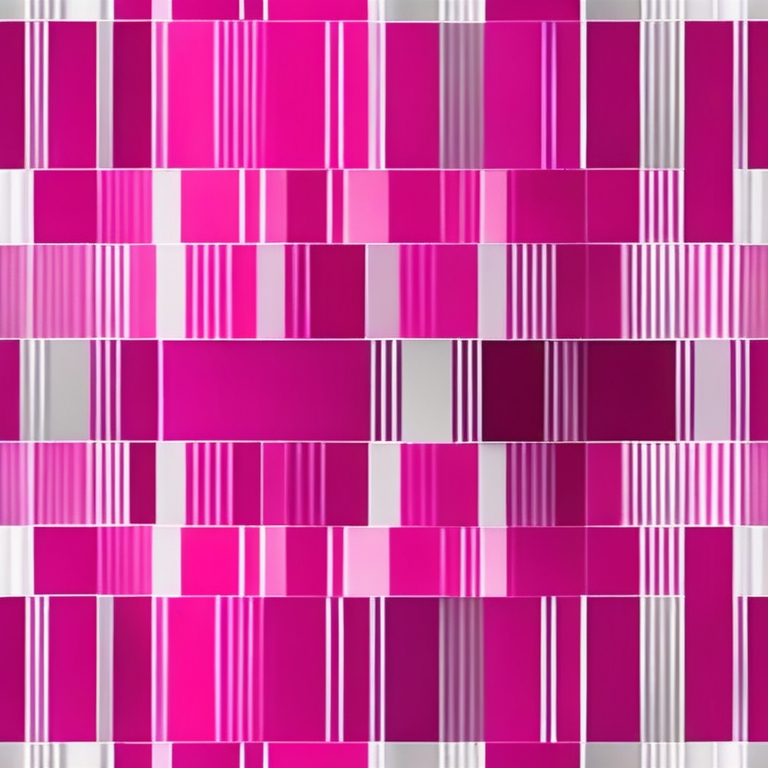

layer_difference=50
decoded text =  +
score=0.4218465805053711
svg length: 9093


100%|██████████| 25/25 [00:03<00:00,  7.35it/s]


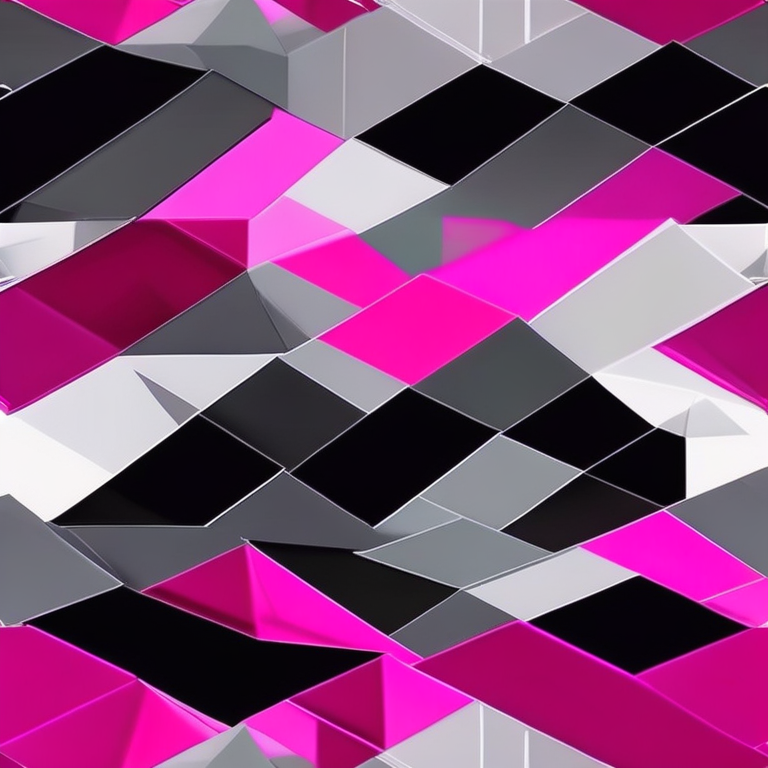

layer_difference=40
decoded text =  A
score=0.4073616981506348
svg length: 9770


100%|██████████| 25/25 [00:03<00:00,  7.44it/s]


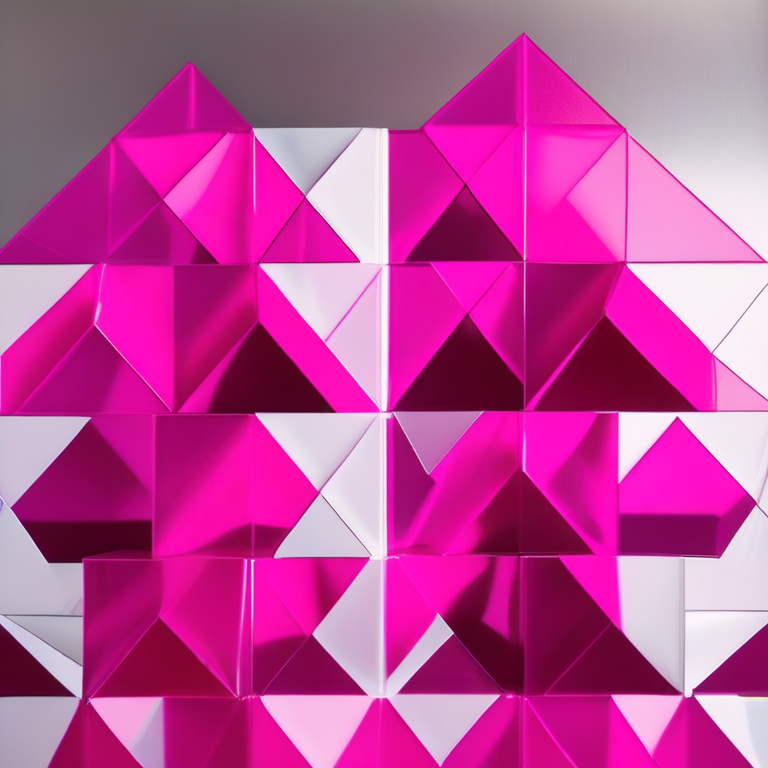

layer_difference=50
decoded text =  A
score=0.4441697597503662
svg length: 9414


100%|██████████| 25/25 [00:03<00:00,  7.38it/s]


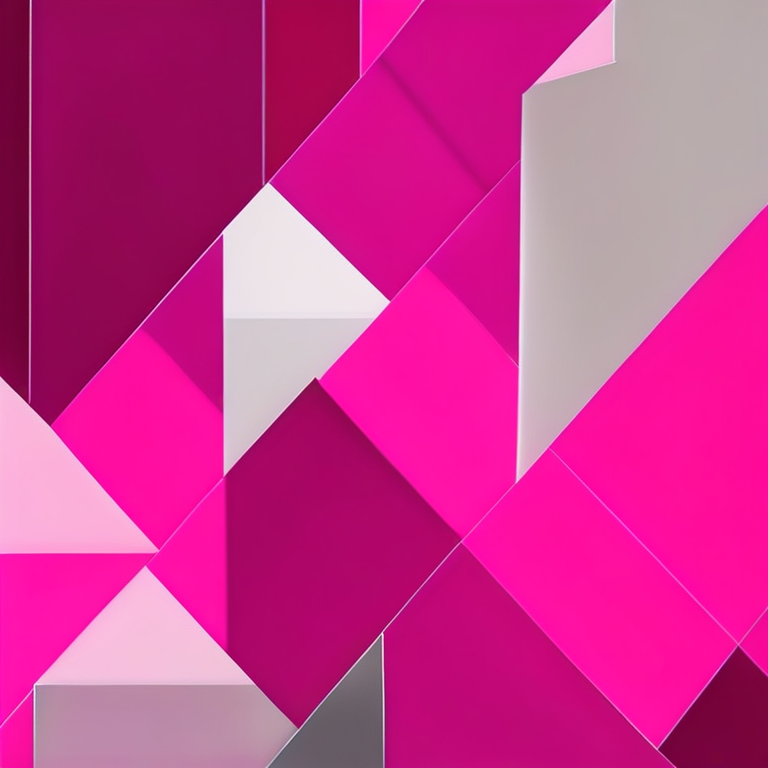

layer_difference=10
decoded text =  A
score=0.4489733695983887
svg length: 7917


100%|██████████| 25/25 [00:03<00:00,  7.35it/s]


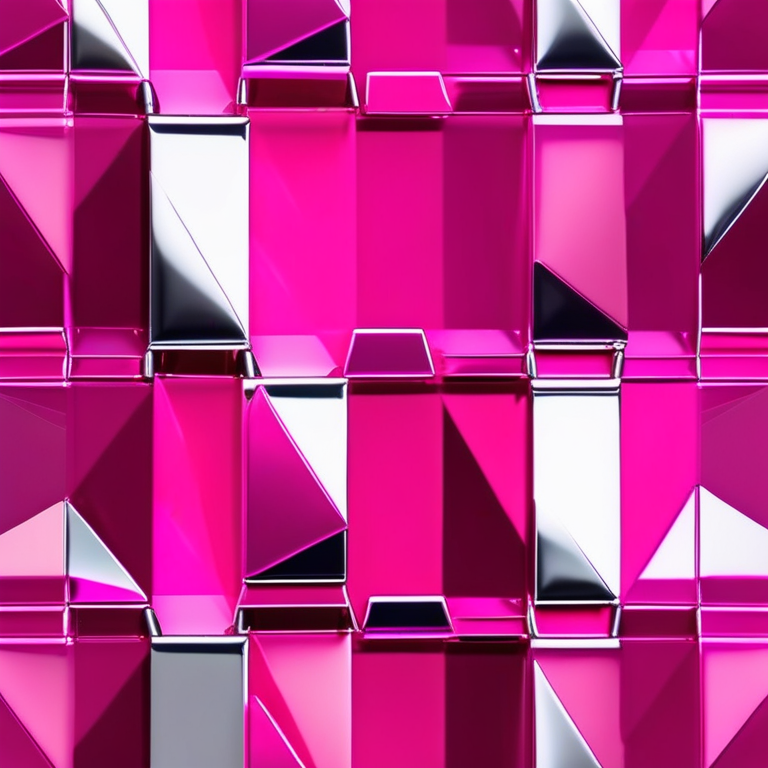

layer_difference=80
decoded text =  A
score=0.4509891510009766
svg length: 9142
final score: 0.4509891510009766


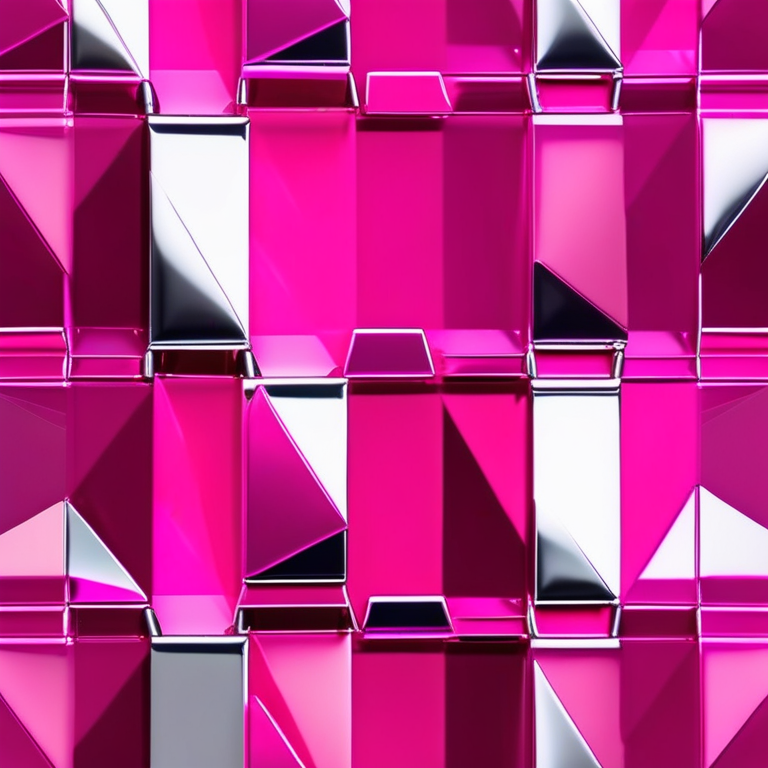

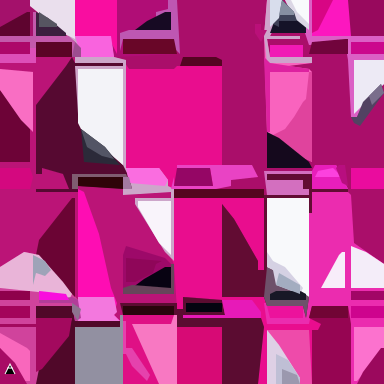

<svg width="384" height="384" viewBox="0 0 384 384"><g transform="scale(3.0)"><polygon points="0,0 128,0 128,128 0,128" fill="#E90D8E"/><polygon points="0,0 10,0 10,2 14,4 26,14 27,19 25,19 25,21 41,21 41,22 25,22 26,38 29,44 41,55 43,59 44,63 41,63 42,64 57,64 57,66 45,66 57,86 58,88 59,103 61,103 62,99 74,100 75,105 87,106 88,109 86,128 0,128" fill="#BB1477"/><polygon points="25,0 128,0 128,88 120,84 117,81 116,65 104,64 104,71 103,71 103,66 89,66 89,89 93,91 92,95 99,96 103,99 102,106 101,102 89,102 88,99 74,99 74,68 78,73 86,87 86,90 88,90 88,66 58,66 58,63 77,62 77,60 74,59 86,59 84,56 74,55 74,22 59,22 58,23 43,23 41,20 38,19 37,12 25,12" fill="#AA0E6A"/><polygon points="8,84 13,85 21,94 26,100 27,106 40,107 40,105 59,105 59,109 74,109 74,128 0,128 0,89" fill="#D0439C"/><polygon points="104,64 116,64 117,65 118,81 128,88 128,128 117,128 116,102 104,103 103,108 89,108 88,101 102,102 102,99 99,97 92,95 91,90 89,89 89,66 103,66" fill="#EB2CAF"/><polygon points="10,0 25,0 25,12 37,12

In [17]:
%%time
r = train_df.iloc[9]
description = r.description
svg, img = model.predict_impl(description)
display(img)
display(SVG(svg))
print(svg)

In [18]:
metric.score_instance(r.multiple_choice_qa, svg, random_seed=42)

decoded text =  A


{'competition_score': 0.3147531249459947,
 'vqa_score': 0.29278194584168077,
 'ocr_score': 1.0,
 'aesthetic_score': 0.44975733757019043}

## Evaluate on train dataset (LB prediction!)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import pandas as pd
from tqdm.auto import tqdm
tqdm.pandas()

In [ ]:
train_df.head()

,id,description,qa,question,choices,answer,multiple_choice_qa
0,02d892,a purple forest at dusk,"{'id': ['02d892', '02d892', '02d892', '02d892'...","[""What is the main setting of the image?"", ""Is...","[[""beach"", ""desert"", ""forest"", ""mountain""], [""...","[""forest"", ""yes"", ""dusk"", ""purple""]",{'question': ['What is the main setting of the...
1,0dcd2e,gray wool coat with a faux fur collar,"{'id': ['0dcd2e', '0dcd2e', '0dcd2e', '0dcd2e'...","[""What color is the coat?"", ""What part of the ...","[[""blue"", ""brown"", ""gray"", ""red""], [""collar"", ...","[""gray"", ""collar"", ""no"", ""wool""]","{'question': ['What color is the coat?', 'What..."
2,1e9ac1,a lighthouse overlooking the ocean,"{'id': ['1e9ac1', '1e9ac1', '1e9ac1', '1e9ac1'...","[""Is there an ocean visible in the image?"", ""W...","[[""no"", ""yes""], [""inside"", ""next to"", ""overloo...","[""yes"", ""overlooking"", ""no"", ""no""]",{'question': ['Is there an ocean visible in th...
3,2b25db,burgundy corduroy pants with patch pockets and...,"{'id': ['2b25db', '2b25db', '2b25db', '2b25db'...","[""Are the pants yellow?"", ""Do the pants have p...","[[""no"", ""yes""], [""no"", ""yes""], [""no"", ""yes""], ...","[""no"", ""yes"", ""yes"", ""pants""]","{'question': ['Are the pants yellow?', 'Do the..."
4,4e6a54,orange corduroy overalls,"{'id': ['4e6a54', '4e6a54', '4e6a54', '4e6a54'...","[""What material is the item?"", ""Is a hat depic...","[[""corduroy"", ""denim"", ""leather"", ""silk""], [""n...","[""corduroy"", ""no"", ""yes"", ""overalls""]","{'question': ['What material is the item?', 'I..."


In [ ]:
%%time
train_df['raw_res'] = train_df.description.progress_apply(model.predict_impl)

  0%|          | 0/15 [00:00<?, ?it/s]

======= a purple forest at dusk =======


100%|██████████| 25/25 [00:03<00:00,  7.11it/s]


layer_difference=30
decoded text =  A
score=0.5357825279235839
svg length: 9009


100%|██████████| 25/25 [00:03<00:00,  7.18it/s]


layer_difference=50
decoded text =  A
score=0.5864708900451661
svg length: 8976


100%|██████████| 25/25 [00:03<00:00,  7.17it/s]


layer_difference=40
decoded text =  A
score=0.5474607467651367
svg length: 9721


100%|██████████| 25/25 [00:03<00:00,  7.22it/s]


layer_difference=40
decoded text =  A
score=0.5432874679565429
svg length: 9146


100%|██████████| 25/25 [00:03<00:00,  7.23it/s]


layer_difference=60


 13%|█▎        | 2/15 [00:36<03:55, 18.09s/it]

decoded text =  A
score=0.5164424896240234
svg length: 9894
final score: 0.5864708900451661
======= gray wool coat with a faux fur collar =======


100%|██████████| 25/25 [00:03<00:00,  7.25it/s]


layer_difference=50
decoded text =  A
score=0.48813595771789553
svg length: 8225


100%|██████████| 25/25 [00:03<00:00,  7.32it/s]


layer_difference=60
decoded text =  A
score=0.4319301128387451
svg length: 8690


100%|██████████| 25/25 [00:03<00:00,  7.19it/s]


layer_difference=10
decoded text =  A
score=0.46469841003417967
svg length: 9974


100%|██████████| 25/25 [00:03<00:00,  7.36it/s]


layer_difference=40
decoded text =  A
score=0.5085203170776367
svg length: 8773


100%|██████████| 25/25 [00:03<00:00,  7.39it/s]


layer_difference=40


 20%|██        | 3/15 [01:11<05:03, 25.30s/it]

decoded text =  A
score=0.513690710067749
svg length: 9504
final score: 0.513690710067749
======= a lighthouse overlooking the ocean =======


100%|██████████| 25/25 [00:03<00:00,  7.48it/s]


layer_difference=10
decoded text =  A
score=0.5829257965087891
svg length: 4064


100%|██████████| 25/25 [00:03<00:00,  7.41it/s]


layer_difference=10
decoded text =  A
score=0.547107744216919
svg length: 9142


100%|██████████| 25/25 [00:03<00:00,  7.50it/s]


layer_difference=10
decoded text =  A
score=0.48197178840637206
svg length: 7263


100%|██████████| 25/25 [00:03<00:00,  7.49it/s]


layer_difference=10
decoded text =  A
score=0.5016863346099854
svg length: 4547


100%|██████████| 25/25 [00:03<00:00,  7.43it/s]


layer_difference=10


 27%|██▋       | 4/15 [01:46<05:16, 28.79s/it]

decoded text =  A
score=0.5139315128326416
svg length: 3718
final score: 0.5829257965087891
======= burgundy corduroy pants with patch pockets and silver buttons =======


100%|██████████| 25/25 [00:03<00:00,  7.41it/s]


layer_difference=50
decoded text =  A
score=0.454388952255249
svg length: 9371


100%|██████████| 25/25 [00:03<00:00,  7.38it/s]


layer_difference=40
decoded text =  A
score=0.4943539619445801
svg length: 9032


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=50
decoded text =  A
score=0.4672397613525391
svg length: 8873


100%|██████████| 25/25 [00:03<00:00,  7.49it/s]


layer_difference=80
decoded text =  A
score=0.42703747749328613
svg length: 8387


100%|██████████| 25/25 [00:03<00:00,  7.37it/s]


layer_difference=30


 33%|███▎      | 5/15 [02:21<05:11, 31.13s/it]

decoded text =  A
score=0.4917123794555664
svg length: 7883
final score: 0.4943539619445801
======= orange corduroy overalls =======


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=10
decoded text =  A
score=0.46755127906799315
svg length: 6900


100%|██████████| 25/25 [00:03<00:00,  7.30it/s]


layer_difference=10
decoded text =  A
score=0.4134075164794922
svg length: 7783


100%|██████████| 25/25 [00:03<00:00,  7.43it/s]


layer_difference=10
decoded text =  joyreactor.cc
score=6.055722108883457e-05
svg length: 8677


100%|██████████| 25/25 [00:03<00:00,  7.38it/s]


layer_difference=40
decoded text =  A
score=0.49643664360046386
svg length: 9397


100%|██████████| 25/25 [00:03<00:00,  7.43it/s]


layer_difference=80


 40%|████      | 6/15 [02:56<04:52, 32.49s/it]

decoded text =  A
score=0.5311769485473633
svg length: 9853
final score: 0.5311769485473633
======= a purple silk scarf with tassel trim =======


100%|██████████| 25/25 [00:03<00:00,  7.45it/s]


layer_difference=100
decoded text =  A
score=0.4699796199798584
svg length: 9221


100%|██████████| 25/25 [00:03<00:00,  7.42it/s]


layer_difference=60
decoded text =  A
score=0.4777707576751709
svg length: 9917


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=10
decoded text =  A
score=0.4361110687255859
svg length: 6845


100%|██████████| 25/25 [00:03<00:00,  7.48it/s]


layer_difference=70
decoded text =  A
score=0.5492863655090332
svg length: 8509


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=10


 47%|████▋     | 7/15 [03:32<04:27, 33.48s/it]

decoded text =  A
score=0.4550062656402588
svg length: 9012
final score: 0.5492863655090332
======= a green lagoon under a cloudy sky =======


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=10
decoded text =  A
score=0.545255470275879
svg length: 9907


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=10
decoded text =  A
score=0.5613752841949463
svg length: 6519


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=20
decoded text =  A
score=0.5622735023498535
svg length: 8662


100%|██████████| 25/25 [00:03<00:00,  7.39it/s]


layer_difference=10
decoded text =  A
score=0.5092298030853272
svg length: 4576


100%|██████████| 25/25 [00:03<00:00,  7.31it/s]


layer_difference=10


 53%|█████▎    | 8/15 [04:07<03:57, 33.95s/it]

decoded text =  A
score=0.5483239173889161
svg length: 9223
final score: 0.5622735023498535
======= crimson rectangles forming a chaotic grid =======


100%|██████████| 25/25 [00:03<00:00,  7.41it/s]


layer_difference=20
decoded text =  A
score=0.46247272491455077
svg length: 8170


100%|██████████| 25/25 [00:03<00:00,  7.45it/s]


layer_difference=10
decoded text =  A
score=0.4194175720214844
svg length: 9603


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=40
decoded text =  A
score=0.4626330852508545
svg length: 7567


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=120
decoded text =  A
score=0.45684003829956055
svg length: 9436


100%|██████████| 25/25 [00:03<00:00,  7.48it/s]


layer_difference=140


 60%|██████    | 9/15 [04:43<03:26, 34.48s/it]

decoded text =  A
score=0.4254631519317627
svg length: 9348
final score: 0.4626330852508545
======= purple pyramids spiraling around a bronze cone =======


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=100
decoded text =  A
score=0.4379269123077393
svg length: 9801


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=130
decoded text =  A
score=0.44146361351013186
svg length: 9831


100%|██████████| 25/25 [00:03<00:00,  7.35it/s]


layer_difference=110
decoded text =  A
score=0.4411165714263916
svg length: 9153


100%|██████████| 25/25 [00:03<00:00,  7.32it/s]


layer_difference=40
decoded text =  A
score=0.5048384189605712
svg length: 9080


100%|██████████| 25/25 [00:03<00:00,  7.40it/s]


layer_difference=30


 67%|██████▋   | 10/15 [05:19<02:55, 35.15s/it]

decoded text =  A
score=0.5207098484039306
svg length: 8564
final score: 0.5207098484039306
======= magenta trapezoids layered on a transluscent silver sheet =======


100%|██████████| 25/25 [00:03<00:00,  7.33it/s]


layer_difference=50
decoded text =  A
score=0.43812193870544436
svg length: 9804


100%|██████████| 25/25 [00:03<00:00,  7.42it/s]


layer_difference=30
decoded text =  A
score=0.4513399600982666
svg length: 7184


100%|██████████| 25/25 [00:03<00:00,  7.43it/s]


layer_difference=50
decoded text =  A
score=0.4189551830291748
svg length: 9403


100%|██████████| 25/25 [00:03<00:00,  7.25it/s]


layer_difference=70
decoded text =  A
score=0.40745177268981936
svg length: 9883


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=80


 73%|███████▎  | 11/15 [05:55<02:21, 35.37s/it]

decoded text =  A
score=0.40860495567321775
svg length: 9756
final score: 0.4513399600982666
======= a snowy plain =======


100%|██████████| 25/25 [00:03<00:00,  7.21it/s]


layer_difference=10
decoded text =  A
score=0.5620944023132324
svg length: 7230


100%|██████████| 25/25 [00:03<00:00,  7.39it/s]


layer_difference=20
decoded text =  A
score=0.5376064300537109
svg length: 8548


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=10
decoded text =  A
score=0.5705964088439941
svg length: 8260


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=60
decoded text =  A
score=0.4404149055480957
svg length: 8782


100%|██████████| 25/25 [00:03<00:00,  7.44it/s]


layer_difference=30


 80%|████████  | 12/15 [06:30<01:45, 35.28s/it]

decoded text =  A
score=0.5456918716430664
svg length: 8949
final score: 0.5705964088439941
======= black and white checkered pants =======


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=120
decoded text =  A
score=0.42415289878845214
svg length: 9545


100%|██████████| 25/25 [00:03<00:00,  7.38it/s]


layer_difference=220
decoded text =  A
score=0.40128750801086427
svg length: 9708


100%|██████████| 25/25 [00:03<00:00,  7.39it/s]


layer_difference=10
decoded text =  A
score=0.4467353343963623
svg length: 7245


100%|██████████| 25/25 [00:03<00:00,  7.39it/s]


layer_difference=70
decoded text =  A
score=0.481670618057251
svg length: 9616


100%|██████████| 25/25 [00:03<00:00,  7.06it/s]


layer_difference=60


 87%|████████▋ | 13/15 [07:06<01:11, 35.55s/it]

decoded text =  A
score=0.42045369148254397
svg length: 8697
final score: 0.481670618057251
======= a starlit night over snow-covered peaks =======


100%|██████████| 25/25 [00:03<00:00,  7.06it/s]


layer_difference=20
decoded text =  A
score=0.595588207244873
svg length: 7963


100%|██████████| 25/25 [00:03<00:00,  7.21it/s]


layer_difference=20
decoded text =  A
score=0.6008235454559326
svg length: 7232


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=30
decoded text =  A
score=0.6276503562927246
svg length: 8009


100%|██████████| 25/25 [00:03<00:00,  7.48it/s]


layer_difference=50
decoded text =  A
score=0.5984302520751953
svg length: 9310


100%|██████████| 25/25 [00:03<00:00,  7.49it/s]


layer_difference=10


 93%|█████████▎| 14/15 [07:42<00:35, 35.49s/it]

decoded text =  A
score=0.5768993377685547
svg length: 7396
final score: 0.6276503562927246
======= khaki triangles and azure crescents =======


100%|██████████| 25/25 [00:03<00:00,  7.45it/s]


layer_difference=140
decoded text =  A
score=0.4265735626220703
svg length: 8810


100%|██████████| 25/25 [00:03<00:00,  7.41it/s]


layer_difference=10
decoded text =  A
score=0.49193782806396485
svg length: 8075


100%|██████████| 25/25 [00:03<00:00,  7.48it/s]


layer_difference=10
decoded text =  A
score=0.4757387638092041
svg length: 6860


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=40
decoded text =  A
score=0.5257905960083008
svg length: 8856


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=10


100%|██████████| 15/15 [08:17<00:00, 35.46s/it]

decoded text =  A
score=0.47205319404602053
svg length: 8799
final score: 0.5257905960083008
======= a maroon dodecahedron interwoven with teal threads =======


100%|██████████| 25/25 [00:03<00:00,  7.47it/s]


layer_difference=60
decoded text =  A
score=0.47365627288818357
svg length: 9196


100%|██████████| 25/25 [00:03<00:00,  7.49it/s]


layer_difference=80
decoded text =  A
score=0.4445653438568115
svg length: 9758


100%|██████████| 25/25 [00:03<00:00,  7.46it/s]


layer_difference=10
decoded text =  A
score=0.49083514213562013
svg length: 6028


100%|██████████| 25/25 [00:03<00:00,  7.49it/s]


layer_difference=10
decoded text =  A
score=0.47612919807434084
svg length: 8049


100%|██████████| 25/25 [00:03<00:00,  7.43it/s]


layer_difference=60


100%|██████████| 15/15 [08:53<00:00, 35.54s/it]

decoded text =  A
score=0.5108699798583984
svg length: 8831
final score: 0.5108699798583984
CPU times: total: 3min 38s
Wall time: 8min 53s


In [ ]:
train_df['svg'] = train_df.raw_res.apply(lambda x: x[0])
train_df['bitmap'] = train_df.raw_res.apply(lambda x: x[1])

In [ ]:
train_df['bitmap_score'] = train_df.progress_apply(
    lambda r: bitmap_score_instance(r.multiple_choice_qa, r.bitmap, random_seed=42),
    axis=1,
)

 13%|█▎        | 2/15 [00:19<02:06,  9.75s/it]

decoded text =  W


 20%|██        | 3/15 [00:22<01:25,  7.13s/it]

decoded text =  © M&S


 27%|██▋       | 4/15 [00:39<01:57, 10.72s/it]

decoded text =  1


 33%|███▎      | 5/15 [00:43<01:21,  8.18s/it]

decoded text =  V


 40%|████      | 6/15 [00:46<00:59,  6.56s/it]

decoded text =  1


 47%|████▋     | 7/15 [00:49<00:44,  5.52s/it]

decoded text =  M


 53%|█████▎    | 8/15 [00:53<00:34,  4.89s/it]

decoded text =  @Artmajeur.com


 60%|██████    | 9/15 [00:56<00:26,  4.41s/it]

decoded text =  © Getty Images


 67%|██████▋   | 10/15 [00:59<00:20,  4.07s/it]

decoded text =  A


 73%|███████▎  | 11/15 [01:18<00:34,  8.58s/it]

decoded text =  © Instagram


 80%|████████  | 12/15 [01:22<00:20,  6.98s/it]

decoded text =  www


 87%|████████▋ | 13/15 [01:25<00:11,  5.93s/it]

decoded text =  @yume_yume


 93%|█████████▎| 14/15 [01:28<00:05,  5.14s/it]

decoded text =  *


100%|██████████| 15/15 [01:32<00:00,  4.62s/it]

decoded text =  freepik


100%|██████████| 15/15 [01:35<00:00,  6.39s/it]

decoded text =  @51CTO博客


In [ ]:
train_df['svg_score'] = train_df.progress_apply(
    lambda r: metric.score_instance(r.multiple_choice_qa, r.svg, random_seed=42),
    axis=1,
)

 13%|█▎        | 2/15 [00:03<00:22,  1.73s/it]

decoded text =  A


 20%|██        | 3/15 [00:06<00:29,  2.43s/it]

decoded text =  A


 27%|██▋       | 4/15 [00:10<00:30,  2.80s/it]

decoded text =  A


 33%|███▎      | 5/15 [00:13<00:30,  3.00s/it]

decoded text =  A


 40%|████      | 6/15 [00:17<00:28,  3.15s/it]

decoded text =  A


 47%|████▋     | 7/15 [00:20<00:25,  3.24s/it]

decoded text =  A


 53%|█████▎    | 8/15 [00:23<00:23,  3.31s/it]

decoded text =  A


 60%|██████    | 9/15 [00:27<00:19,  3.32s/it]

decoded text =  A


 67%|██████▋   | 10/15 [00:30<00:16,  3.34s/it]

decoded text =  A


 73%|███████▎  | 11/15 [00:34<00:13,  3.34s/it]

decoded text =  A


 80%|████████  | 12/15 [00:37<00:10,  3.36s/it]

decoded text =  A


 87%|████████▋ | 13/15 [00:40<00:06,  3.38s/it]

decoded text =  A


 93%|█████████▎| 14/15 [00:44<00:03,  3.37s/it]

decoded text =  A


100%|██████████| 15/15 [00:47<00:00,  3.39s/it]

decoded text =  A


100%|██████████| 15/15 [00:51<00:00,  3.41s/it]

decoded text =  A


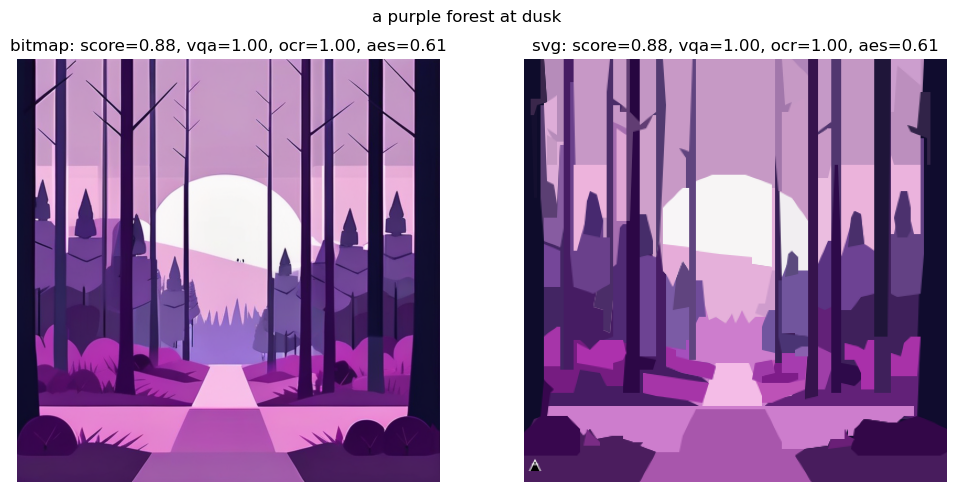

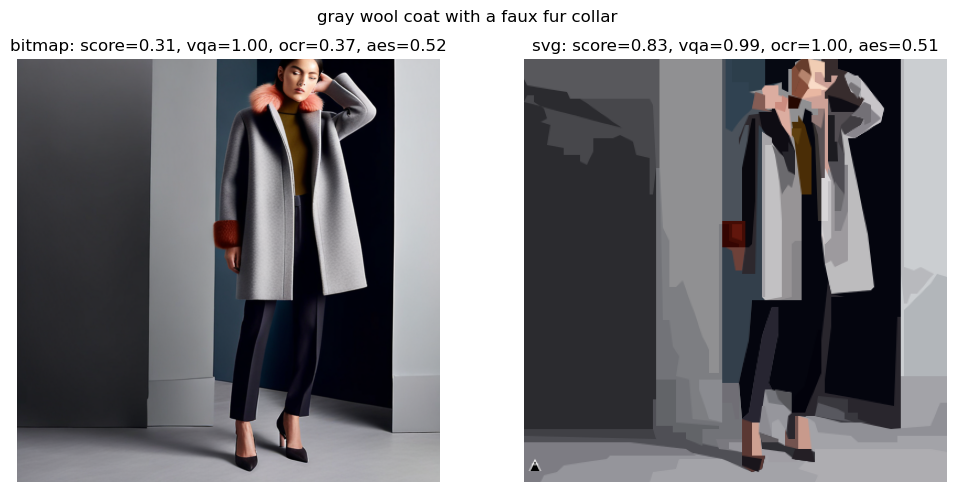

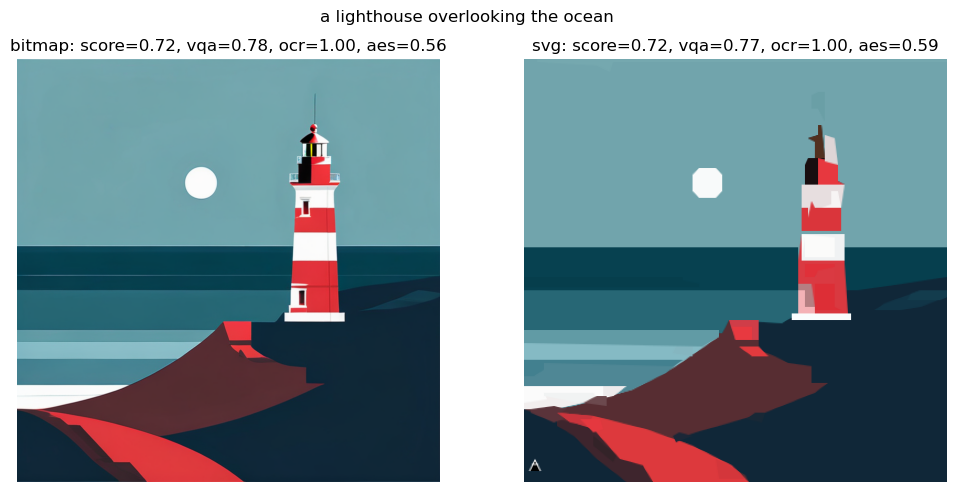

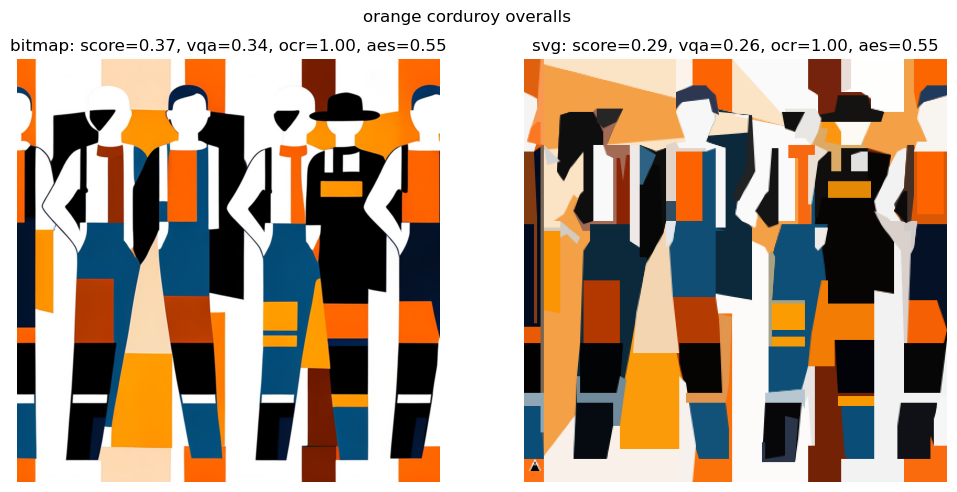

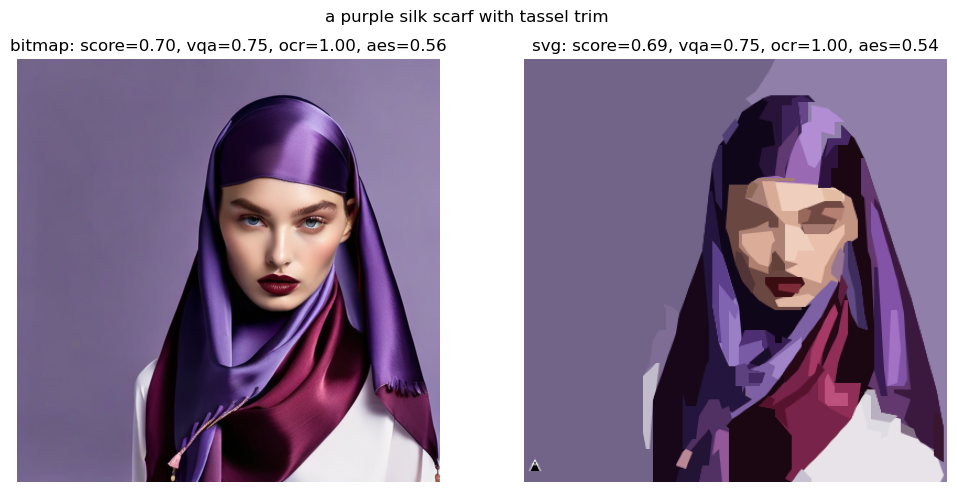

...

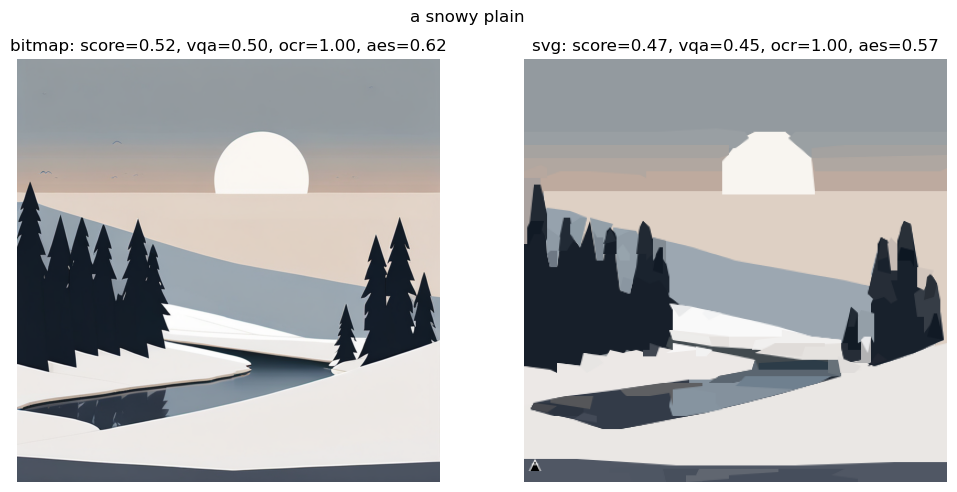

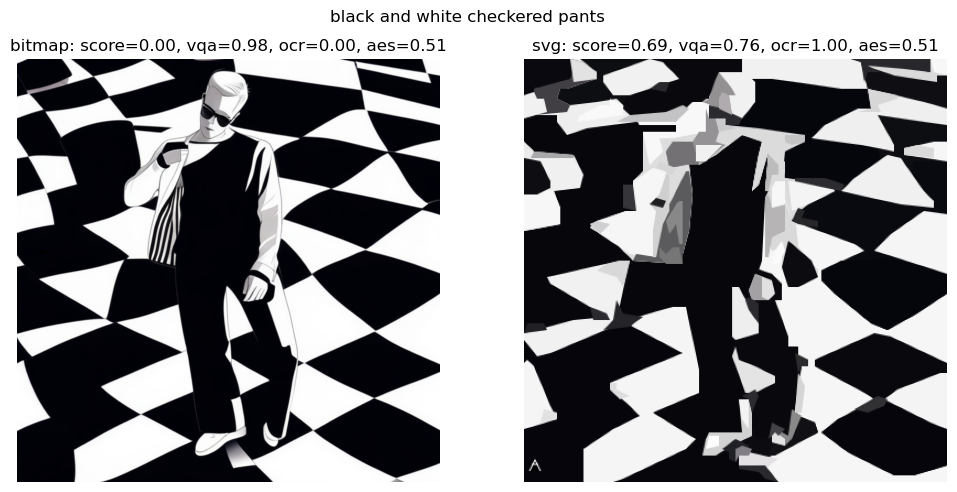

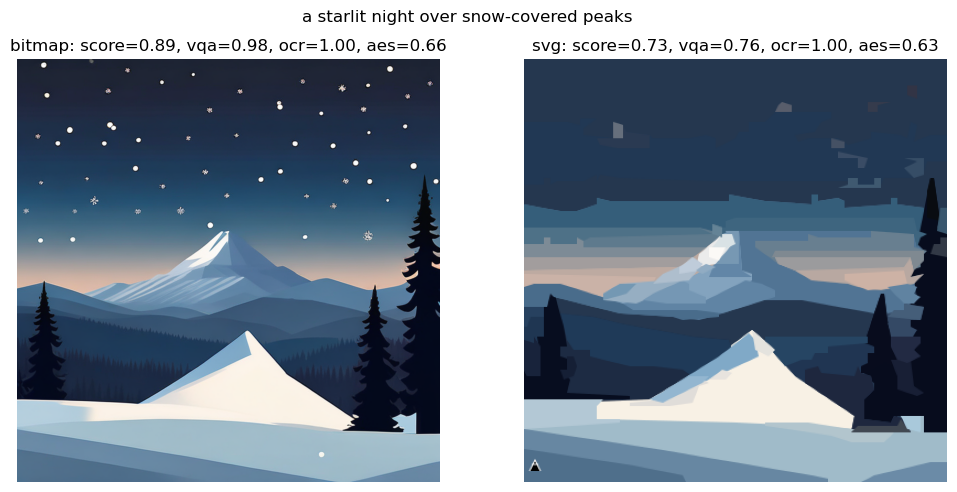

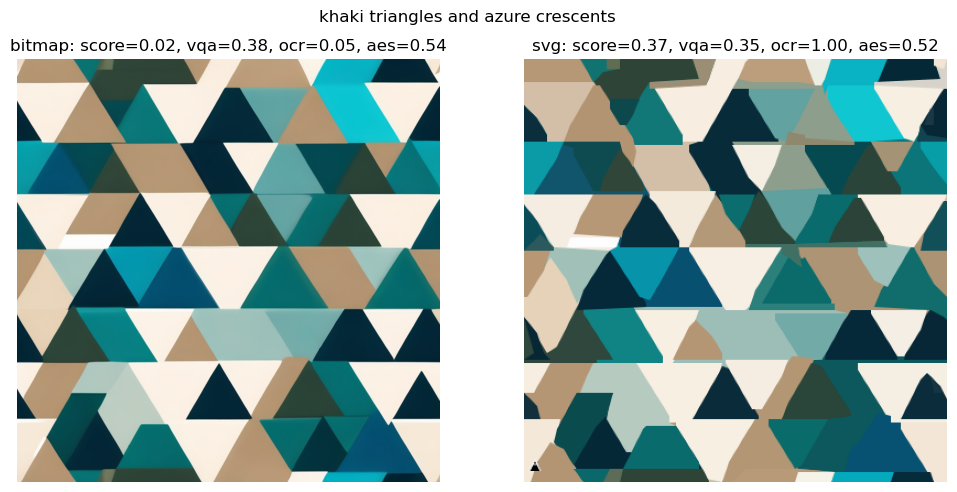

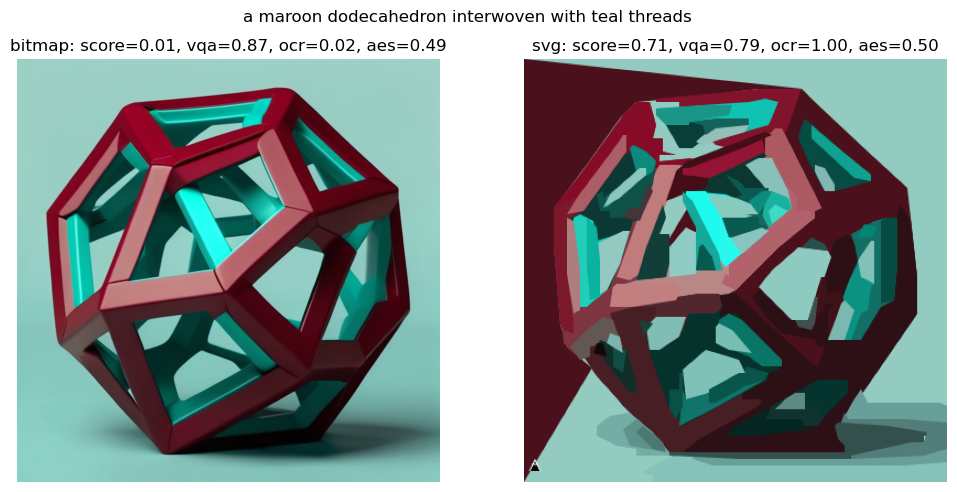

In [ ]:
for r in train_df.itertuples():
    
    b_vqa = r.bitmap_score['vqa_score']
    b_aesthetic = r.bitmap_score['aesthetic_score']
    b_ocr = r.bitmap_score['ocr_score']
    b_score = r.bitmap_score['competition_score']

    
    s_vqa = r.svg_score['vqa_score']
    s_aesthetic = r.svg_score['aesthetic_score']
    s_ocr = r.svg_score['ocr_score']
    s_score = r.svg_score['competition_score']
    
    plt.figure(figsize=(12, 6))
    plt.suptitle(r.description, y=0.93)
    
    plt.subplot(1, 2, 1)
    plt.imshow(np.array(r.bitmap))
    plt.axis('off')
    plt.title(f'bitmap: score={b_score:.2f}, vqa={b_vqa:.2f}, ocr={b_ocr:.2f}, aes={b_aesthetic:.2f}')

    plt.subplot(1, 2, 2)
    plt.imshow(metric.svg_to_png(r.svg))
    plt.axis('off')
    plt.title(f'svg: score={s_score:.2f}, vqa={s_vqa:.2f}, ocr={s_ocr:.2f}, aes={s_aesthetic:.2f}')

In [ ]:
mean_bitmap_score = pd.DataFrame(train_df['bitmap_score'].tolist()).mean(axis=0)
mean_bitmap_score

competition_score    0.397771
vqa_score            0.752447
ocr_score            0.562631
aesthetic_score      0.540007
dtype: float64

In [ ]:
mean_svg_score = pd.DataFrame(train_df['svg_score'].tolist()).mean(axis=0)
mean_svg_score

competition_score    0.624888
vqa_score            0.680936
ocr_score            1.000000
aesthetic_score      0.533304
dtype: float64

In [ ]:
print(f'Original bitmap score: {mean_bitmap_score.competition_score}')
print(f'Final svg score: {mean_svg_score.competition_score}')

Original bitmap score: 0.3977709904037567
Final svg score: 0.62488784473765
